In [1]:
import gc
import os
import subprocess
import sys
import tempfile
import urllib.request
from pathlib import Path

import cv2
import laspy
import matplotlib.pyplot as plt
import numpy as np
import OpenEXR
import Imath
import torch
import torch.nn.functional as F
from PIL import Image
from scipy import ndimage
from scipy.stats import skew
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry
from segment_anything.utils.transforms import ResizeLongestSide

cwd = Path.cwd().resolve()
if (cwd / 'data').exists() and (cwd / 'MAIN_TEST').exists():
    PROJECT_ROOT = cwd
elif (cwd.parent / 'data').exists() and (cwd.parent / 'MAIN_TEST').exists():
    PROJECT_ROOT = cwd.parent.resolve()
else:
    raise FileNotFoundError('Run this notebook from the repo root or MAIN_TEST.')

MAIN_TEST_DIR = PROJECT_ROOT / 'MAIN_TEST'
OUTPUT_FOLDER = MAIN_TEST_DIR / 'pointclouds_marigold'
OUTPUT_FOLDER.mkdir(parents=True, exist_ok=True)

DATASET = 'test2'
CAMERA_FOV = 90.0
MASK_PATH = None
SAVE_MASK = False
SHOW_PLOT = True

GT_TO_CENTIMETERS = 10000.0
MIN_DEPTH = 0.001
SKY_KNEE_FRAC = 0.01
MARIGOLD_MAX_RESOLUTION = 768
MARIGOLD_GUIDANCE_MIN_DEPTH = 0.1
MARIGOLD_GUIDANCE_MAX_DEPTH = 100.0
SAM_CHECKPOINT = PROJECT_ROOT / 'weights' / 'sam_vit_b_01ec64.pth'
SAM_CHECKPOINT_URL = 'https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth'

input_folder = PROJECT_ROOT / 'data' / DATASET
device = 'cuda' if torch.cuda.is_available() else 'cpu'

print(f'Project root: {PROJECT_ROOT}')
print(f'Input folder: {input_folder}')
print(f'Device: {device.upper()}')


Project root: C:\Users\parve\OneDrive - University College London\.Year 2\other\UE_depth
Input folder: C:\Users\parve\OneDrive - University College London\.Year 2\other\UE_depth\data\test2
Device: CUDA


In [2]:
def load_exr_rgb(path):
    exr = OpenEXR.InputFile(str(path))
    dw = exr.header()['dataWindow']
    width = dw.max.x - dw.min.x + 1
    height = dw.max.y - dw.min.y + 1
    pixel_type = Imath.PixelType(Imath.PixelType.FLOAT)
    rgb = np.stack(
        [
            np.frombuffer(exr.channel(channel, pixel_type), np.float32).reshape(height, width)
            for channel in 'RGB'
        ],
        axis=-1,
    )
    return Image.fromarray(np.clip(rgb * 255, 0, 255).astype(np.uint8))


def load_exr_depth(path):
    exr = OpenEXR.InputFile(str(path))
    header = exr.header()
    dw = header['dataWindow']
    width = dw.max.x - dw.min.x + 1
    height = dw.max.y - dw.min.y + 1
    pixel_type = Imath.PixelType(Imath.PixelType.FLOAT)
    channels = list(header['channels'].keys())

    for name in ['R', 'SceneDepth', 'Z']:
        if name in channels:
            depth = np.frombuffer(exr.channel(name, pixel_type), np.float32).reshape(height, width).copy()
            break
    else:
        raise ValueError(f'No depth channel found in {path}')

    return (depth * GT_TO_CENTIMETERS) / 100.0


def load_image(path):
    path = Path(path)
    return load_exr_rgb(path) if path.suffix.lower() == '.exr' else Image.open(path).convert('RGB')


def find_dataset_files(folder):
    files = os.listdir(folder)
    original_rgb = next(
        Path(folder) / file_name
        for file_name in files
        if file_name.endswith('.exr') and 'depth' not in file_name.lower() and 'scenedepth' not in file_name.lower()
    )
    edited_rgb = next(
        Path(folder) / file_name
        for file_name in files
        if 'edit' in file_name.lower() and file_name.endswith(('.png', '.jpg', '.jpeg', '.exr'))
    )
    depth_gt = next(
        Path(folder) / file_name
        for file_name in files
        if 'SceneDepth' in file_name and 'WorldUnits' not in file_name and file_name.endswith('.exr')
    )
    return original_rgb, edited_rgb, depth_gt


def detect_sky_knee(gt_depth):
    gt_positive = gt_depth[gt_depth > MIN_DEPTH].ravel()
    bin_width = 0.25
    bins = np.arange(0, gt_positive.max() + bin_width, bin_width)
    counts, edges = np.histogram(gt_positive, bins=bins)
    centres = (edges[:-1] + edges[1:]) / 2

    peak_count = counts.max()
    peak_bin = centres[np.argmax(counts)]
    candidates = np.where((centres > peak_bin) & (counts < peak_count * SKY_KNEE_FRAC))[0]
    sky_threshold = centres[candidates[0]] if len(candidates) > 0 else gt_positive.max()

    sky_mask = gt_depth >= sky_threshold
    depth_cap = gt_depth[~sky_mask & (gt_depth > MIN_DEPTH)].max() if sky_mask.any() else gt_depth.max()
    valid_depth_mask = ~sky_mask & (gt_depth > MIN_DEPTH)
    return sky_threshold, sky_mask, depth_cap, valid_depth_mask


def default_mask_path(dataset):
    return PROJECT_ROOT / 'change_detection_results' / dataset / f'gescf_{dataset}_mask.npy'


def maybe_download_sam_checkpoint():
    if SAM_CHECKPOINT.exists():
        return
    SAM_CHECKPOINT.parent.mkdir(parents=True, exist_ok=True)
    print('Downloading SAM ViT-B weights (~375 MB)...')
    urllib.request.urlretrieve(SAM_CHECKPOINT_URL, SAM_CHECKPOINT)


def compute_gescf_mask(original_img, edited_resized, target_shape, device):
    maybe_download_sam_checkpoint()

    for name in ('sam', 'mask_gen', 'hook', 'qkv1', 'qkv2', 'f1', 'f2', 'cos_sim'):
        globals().pop(name, None)
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    sam = sam_model_registry['vit_b'](checkpoint=str(SAM_CHECKPOINT)).to(device).eval()
    height, width = np.array(original_img).shape[:2]

    captured = {}

    def hook_qkv(module, hook_input, hook_output):
        captured['qkv'] = hook_output.detach()

    hook = sam.image_encoder.blocks[8].attn.qkv.register_forward_hook(hook_qkv)
    img_size = sam.image_encoder.img_size
    sam_transform = ResizeLongestSide(img_size)
    patch_size = 16
    sam_scale = img_size / max(height, width)
    feat_height = int(height * sam_scale + 0.5) // patch_size
    feat_width = int(width * sam_scale + 0.5) // patch_size

    def prepare_sam(pil_img):
        transformed = sam_transform.apply_image(np.array(pil_img))
        return sam.preprocess(torch.as_tensor(transformed, device=device).permute(2, 0, 1).unsqueeze(0).float())

    with torch.no_grad():
        sam.image_encoder(prepare_sam(original_img))
        qkv1 = captured['qkv']
        sam.image_encoder(prepare_sam(edited_resized))
        qkv2 = captured['qkv']
    hook.remove()
    del prepare_sam, hook_qkv
    captured.clear()

    with torch.no_grad():
        f1 = qkv1.squeeze(0)
        f2 = qkv2.squeeze(0)
        cos_sim = (F.normalize(f1, dim=-1) * F.normalize(f2, dim=-1)).sum(dim=-1)
        dist_map = (1 - cos_sim).cpu().numpy()[:feat_height, :feat_width]

    del qkv1, qkv2, f1, f2, cos_sim
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    dist_map = (
        F.interpolate(
            torch.tensor(dist_map)[None, None].float(),
            size=(height, width),
            mode='bilinear',
            align_corners=False,
        )
        .squeeze()
        .numpy()
    )
    dist_map = ndimage.gaussian_filter(dist_map, sigma=4)
    dist_map = (dist_map - dist_map.min()) / (dist_map.max() - dist_map.min() + 1e-8)

    skewness = skew(dist_map.ravel())
    k_value = np.clip(skewness, 1.0, 3.0)
    threshold = dist_map.mean() + k_value * dist_map.std()
    initial_mask = dist_map > threshold

    mask_gen = SamAutomaticMaskGenerator(
        sam,
        points_per_side=16,
        pred_iou_thresh=0.80,
        stability_score_thresh=0.85,
        min_mask_region_area=200,
    )
    sam_masks = mask_gen.generate(np.array(edited_resized))
    changed_mask = np.zeros((height, width), dtype=bool)
    for segment in sam_masks:
        segmentation = segment['segmentation']
        if segmentation.sum() > 0 and np.logical_and(segmentation, initial_mask).sum() / segmentation.sum() > 0.3:
            changed_mask |= segmentation
    if changed_mask.sum() == 0:
        changed_mask = initial_mask

    del sam, mask_gen, sam_masks
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    if changed_mask.shape != target_shape:
        changed_mask = cv2.resize(
            changed_mask.astype(np.uint8),
            (target_shape[1], target_shape[0]),
            interpolation=cv2.INTER_NEAREST,
        ) > 0

    print(f'Changed pixels: {changed_mask.sum():,} ({changed_mask.mean() * 100:.1f}%)')
    print(f'Threshold: {threshold:.4f} (skew={skewness:.2f}, k={k_value:.2f})')
    return changed_mask.astype(bool)


def load_or_compute_mask(dataset, original_img, edited_resized, target_shape, device, mask_path=None, save_mask=False):
    resolved_mask_path = Path(mask_path) if mask_path else default_mask_path(dataset)
    if resolved_mask_path.exists():
        print(f'Loading precomputed change mask: {resolved_mask_path}')
        changed_mask = np.load(resolved_mask_path).astype(bool)
        if changed_mask.shape != target_shape:
            changed_mask = cv2.resize(
                changed_mask.astype(np.uint8),
                (target_shape[1], target_shape[0]),
                interpolation=cv2.INTER_NEAREST,
            ) > 0
        print(f'Changed pixels: {changed_mask.sum():,} ({changed_mask.mean() * 100:.1f}%)')
        return changed_mask

    print('No precomputed mask found. Computing GeSCF mask...')
    changed_mask = compute_gescf_mask(original_img, edited_resized, target_shape, device)
    if save_mask:
        resolved_mask_path.parent.mkdir(parents=True, exist_ok=True)
        np.save(resolved_mask_path, changed_mask.astype(np.uint8))
        print(f'Saved computed mask: {resolved_mask_path}')
    return changed_mask


def build_sparse_guidance(gt_depth, unchanged_mask):
    valid_guidance = (
        unchanged_mask
        & (gt_depth > MARIGOLD_GUIDANCE_MIN_DEPTH)
        & (gt_depth < MARIGOLD_GUIDANCE_MAX_DEPTH)
        & np.isfinite(gt_depth)
    )
    sparse_guidance = np.where(valid_guidance, gt_depth, 0.0).astype(np.float32)
    return sparse_guidance, valid_guidance


def get_processing_shape(height, width, max_resolution):
    longest_side = max(height, width)
    if longest_side <= max_resolution:
        return height, width

    scale = max_resolution / longest_side
    resized_height = max(8, int(round((height * scale) / 8.0) * 8))
    resized_width = max(8, int(round((width * scale) / 8.0) * 8))
    return resized_height, resized_width


def run_marigold_subprocess(rgb_path, sparse_depth_path, output_path):
    marigold_repo = PROJECT_ROOT / 'Marigold-DC'
    if not marigold_repo.is_dir():
        raise FileNotFoundError(
            f'Marigold-DC repo not found at {marigold_repo}. '
            'Clone https://github.com/prs-eth/Marigold-DC into the project root first.'
        )

    env = os.environ.copy()
    env.setdefault('PYTORCH_CUDA_ALLOC_CONF', 'expandable_segments:True')
    result = subprocess.run(
        [
            sys.executable,
            '-m',
            'marigold_dc',
            '--in-image',
            str(rgb_path),
            '--in-depth',
            str(sparse_depth_path),
            '--out-depth',
            str(output_path),
            '--processing_resolution',
            '0',
        ],
        capture_output=True,
        timeout=3600,
        cwd=str(marigold_repo),
        env=env,
    )

    stdout_text = result.stdout.decode('utf-8', errors='replace') if result.stdout else ''
    stderr_text = result.stderr.decode('utf-8', errors='replace') if result.stderr else ''

    if result.returncode != 0:
        raise RuntimeError(
            f'Marigold-DC failed (exit code {result.returncode}):\n'
            f'STDOUT:\n{stdout_text}\n'
            f'STDERR:\n{stderr_text}'
        )

    if stdout_text.strip():
        print(stdout_text.strip())


def create_visualization(original_img, edited_img, gt_depth, dense_depth, changed_mask, sky_mask, output_path, show_plot):
    non_sky_depths = gt_depth[~sky_mask & (gt_depth > MIN_DEPTH)]
    vmin_depth = 0
    vmax_depth = np.percentile(non_sky_depths, 99)

    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    axes[0].imshow(original_img)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(edited_img)
    axes[1].set_title('Edited Image')
    axes[1].axis('off')

    cmap_depth = plt.cm.turbo
    norm_depth = plt.Normalize(vmin=vmin_depth, vmax=vmax_depth)

    gt_rgba = cmap_depth(norm_depth(np.clip(gt_depth, vmin_depth, vmax_depth)))
    gt_rgba[sky_mask] = [0.2, 0.2, 0.2, 1.0]
    axes[2].imshow(gt_rgba)
    axes[2].set_title('GT Depth')
    axes[2].axis('off')

    sm_depth = plt.cm.ScalarMappable(cmap=cmap_depth, norm=norm_depth)
    sm_depth.set_array([])
    plt.colorbar(sm_depth, ax=axes[2], fraction=0.046, pad=0.04, label='meters')

    pred_rgba = cmap_depth(norm_depth(np.clip(dense_depth, vmin_depth, vmax_depth)))
    pred_rgba[sky_mask] = [0.2, 0.2, 0.2, 1.0]
    axes[3].imshow(pred_rgba)
    axes[3].set_title('Marigold-DC Depth')
    axes[3].axis('off')
    plt.colorbar(sm_depth, ax=axes[3], fraction=0.046, pad=0.04, label='meters')

    unchanged_mask = ~changed_mask
    unchanged_mask_clean = ndimage.binary_erosion(unchanged_mask, iterations=2)
    error_signed = dense_depth - gt_depth
    error_range = 0.5
    cmap_error = plt.cm.PuOr
    norm_error = plt.Normalize(vmin=-error_range, vmax=error_range)
    error_rgba = cmap_error(norm_error(np.clip(error_signed, -error_range, error_range)))
    error_rgba[~unchanged_mask_clean] = [0.0, 1.0, 1.0, 1.0]
    error_rgba[sky_mask] = [0.2, 0.2, 0.2, 1.0]
    axes[4].imshow(error_rgba)
    mae = np.mean(np.abs(error_signed[unchanged_mask]))
    axes[4].set_title(f'Error (MAE={mae:.3f}m)')
    axes[4].axis('off')

    sm_error = plt.cm.ScalarMappable(cmap=cmap_error, norm=norm_error)
    sm_error.set_array([])
    plt.colorbar(sm_error, ax=axes[4], fraction=0.046, pad=0.04, label='meters')

    plt.suptitle('Marigold-DC Point Cloud Pipeline', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(output_path, dpi=150, bbox_inches='tight')
    print(f'Saved preview: {output_path}')
    if show_plot:
        plt.show()
    else:
        plt.close(fig)


def save_las(output_path, x, y, z, rgb):
    header = laspy.LasHeader(point_format=3, version='1.2')
    header.scales = np.array([0.001, 0.001, 0.001])
    las = laspy.LasData(header=header)
    las.x = z
    las.y = x
    las.z = -y
    las.red = rgb[:, 0].astype(np.uint16) * 256
    las.green = rgb[:, 1].astype(np.uint16) * 256
    las.blue = rgb[:, 2].astype(np.uint16) * 256
    las.write(str(output_path))
    print(f'Saved {len(z):,} points to {output_path}')


In [3]:
original_path, edited_path, gt_depth_path = find_dataset_files(input_folder)
print(f'Original: {original_path.name}')
print(f'Edited:   {edited_path.name}')
print(f'GT Depth: {gt_depth_path.name}')

original_img = load_image(original_path)
edited_img = load_image(edited_path)
gt_depth = load_exr_depth(gt_depth_path)
gt_height, gt_width = gt_depth.shape
edited_resized = edited_img.resize(original_img.size, Image.BILINEAR) if edited_img.size != original_img.size else edited_img

sky_threshold, sky_mask, depth_cap, valid_depth_mask = detect_sky_knee(gt_depth)
print(f'Original size: {original_img.size}, Edited size: {edited_img.size}')
print(f'GT depth:      {gt_depth.shape}, range: {gt_depth.min():.4f}m - {gt_depth.max():.2f}m')
print(f'Sky threshold: {sky_threshold:.2f}m')
print(f'Depth cap:     {depth_cap:.2f}m')


Original: HighresScreenshot00000.exr
Edited:   edit2.png
GT Depth: HighresScreenshot00000_SceneDepth.exr
Original size: (1526, 858), Edited size: (2752, 1536)
GT depth:      (858, 1526), range: 0.0076m - 100.00m
Sky threshold: 4.62m
Depth cap:     4.62m


No precomputed mask found. Computing GeSCF mask...
Changed pixels: 103,173 (7.9%)
Threshold: 0.5628 (skew=2.67, k=2.67)


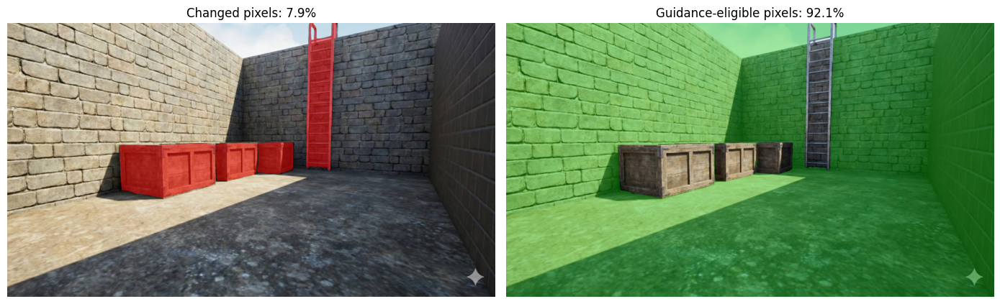

In [4]:
changed_mask = load_or_compute_mask(
    DATASET,
    original_img,
    edited_resized,
    gt_depth.shape,
    device,
    mask_path=MASK_PATH,
    save_mask=SAVE_MASK,
)
unchanged_mask = ~changed_mask

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
overlay_changed = np.zeros((*changed_mask.shape, 4), dtype=np.float32)
overlay_changed[changed_mask] = [1, 0, 0, 0.5]
overlay_unchanged = np.zeros((*changed_mask.shape, 4), dtype=np.float32)
overlay_unchanged[unchanged_mask] = [0, 0.8, 0, 0.35]

axes[0].imshow(edited_resized)
axes[0].imshow(overlay_changed)
axes[0].set_title(f'Changed pixels: {changed_mask.mean() * 100:.1f}%')
axes[0].axis('off')

axes[1].imshow(edited_resized)
axes[1].imshow(overlay_unchanged)
axes[1].set_title(f'Guidance-eligible pixels: {unchanged_mask.mean() * 100:.1f}%')
axes[1].axis('off')

plt.tight_layout()
plt.show()


In [5]:
sparse_guidance, valid_guidance = build_sparse_guidance(gt_depth, unchanged_mask & valid_depth_mask)
if valid_guidance.sum() == 0:
    raise ValueError('No valid unchanged GT pixels available for Marigold guidance')

process_height, process_width = get_processing_shape(gt_height, gt_width, MARIGOLD_MAX_RESOLUTION)
print(f'Marigold input size: {process_width}x{process_height}')

edited_for_marigold = edited_img.resize((process_width, process_height), Image.BILINEAR)
guidance_for_marigold = sparse_guidance
if (process_height, process_width) != gt_depth.shape:
    guidance_for_marigold = cv2.resize(
        sparse_guidance,
        (process_width, process_height),
        interpolation=cv2.INTER_NEAREST,
    ).astype(np.float32)
print(f'Guidance pixels: {np.count_nonzero(guidance_for_marigold):,}')

dense_output_stem = f'{DATASET}_marigold_dc'
dense_depth_path = OUTPUT_FOLDER / f'{dense_output_stem}_depth.npy'
preview_path = OUTPUT_FOLDER / f'{dense_output_stem}_preview.png'
las_path = OUTPUT_FOLDER / f'{dense_output_stem}.las'

with tempfile.NamedTemporaryFile(suffix='.png', delete=False) as rgb_tmp, tempfile.NamedTemporaryFile(
    suffix='.npy', delete=False
) as sparse_tmp:
    rgb_tmp_path = Path(rgb_tmp.name)
    sparse_tmp_path = Path(sparse_tmp.name)

try:
    edited_for_marigold.save(rgb_tmp_path)
    np.save(sparse_tmp_path, guidance_for_marigold)
    run_marigold_subprocess(rgb_tmp_path, sparse_tmp_path, dense_depth_path)
finally:
    if rgb_tmp_path.exists():
        rgb_tmp_path.unlink()
    if sparse_tmp_path.exists():
        sparse_tmp_path.unlink()

dense_depth = np.load(dense_depth_path)
if dense_depth.shape != gt_depth.shape:
    dense_depth = cv2.resize(dense_depth.astype(np.float32), (gt_width, gt_height), interpolation=cv2.INTER_LINEAR)
    np.save(dense_depth_path, dense_depth)

print(f'Dense depth range: {dense_depth.min():.4f}m - {dense_depth.max():.2f}m')


Marigold input size: 768x432
Guidance pixels: 297,058
Dense depth range: 0.1396m - 4.33m


Unchanged regions - MAE: 1.3869m, RMSE: 9.3739m
Saved preview: C:\Users\parve\OneDrive - University College London\.Year 2\other\UE_depth\MAIN_TEST\pointclouds_marigold\test2_marigold_dc_preview.png


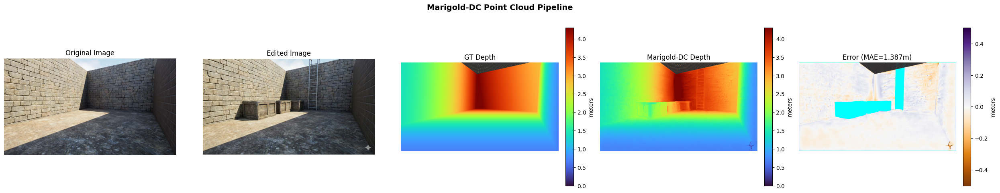

In [6]:
unchanged_eval_mask = unchanged_mask & np.isfinite(gt_depth) & np.isfinite(dense_depth)
mae = np.mean(np.abs(dense_depth[unchanged_eval_mask] - gt_depth[unchanged_eval_mask]))
rmse = np.sqrt(np.mean((dense_depth[unchanged_eval_mask] - gt_depth[unchanged_eval_mask]) ** 2))
print(f'Unchanged regions - MAE: {mae:.4f}m, RMSE: {rmse:.4f}m')

create_visualization(
    original_img,
    edited_img,
    gt_depth,
    dense_depth,
    changed_mask,
    sky_mask,
    preview_path,
    show_plot=SHOW_PLOT,
)


In [7]:
edit_width, edit_height = edited_img.size
depth_full = cv2.resize(dense_depth.astype(np.float32), (edit_width, edit_height), interpolation=cv2.INTER_LINEAR)
sky_full = cv2.resize(sky_mask.astype(np.uint8), (edit_width, edit_height), interpolation=cv2.INTER_NEAREST) > 0
changed_full = cv2.resize(changed_mask.astype(np.uint8), (edit_width, edit_height), interpolation=cv2.INTER_NEAREST) > 0

sky_unchanged = sky_full & ~changed_full
sky_changed = changed_full & (depth_full > depth_cap)
sky_final = sky_unchanged | sky_changed

focal = edit_width / (2 * np.tan(np.radians(CAMERA_FOV / 2)))
cx, cy = edit_width / 2, edit_height / 2
xx, yy = np.meshgrid(np.arange(edit_width), np.arange(edit_height))

z = depth_full.flatten()
x = (xx.flatten() - cx) * z / focal
y = (yy.flatten() - cy) * z / focal
rgb = np.array(edited_img).reshape(-1, 3)

keep_mask = (z >= MIN_DEPTH) & ~sky_final.flatten()
x, y, z, rgb = x[keep_mask], y[keep_mask], z[keep_mask], rgb[keep_mask]

print(f'Point cloud: {len(z):,} points')
print(f'  sky_unchanged: {sky_unchanged.sum():,} ({sky_unchanged.mean() * 100:.1f}%)')
print(f'  sky_changed:   {sky_changed.sum():,} ({sky_changed.mean() * 100:.1f}%)')
print(f'  sky_final:     {sky_final.sum():,} ({sky_final.mean() * 100:.1f}%)')


Point cloud: 4,118,960 points
  sky_unchanged: 108,112 (2.6%)
  sky_changed:   0 (0.0%)
  sky_final:     108,112 (2.6%)


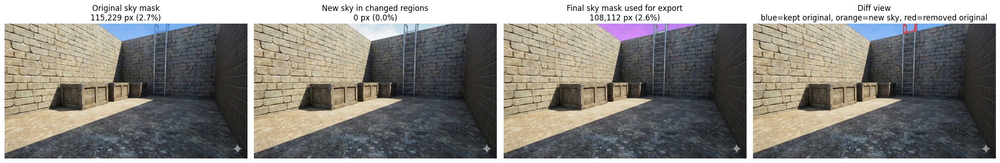

In [8]:
fig, axes = plt.subplots(1, 4, figsize=(22, 5))

def build_overlay(mask, color, alpha=0.55):
    overlay = np.zeros((edit_height, edit_width, 4), dtype=np.float32)
    overlay[mask] = [*color, alpha]
    return overlay

sky_removed = sky_full & changed_full & ~sky_changed
panels = [
    ('Original sky mask', sky_full, (0.2, 0.55, 1.0)),
    ('New sky in changed regions', sky_changed, (1.0, 0.55, 0.1)),
    ('Final sky mask used for export', sky_final, (0.75, 0.2, 1.0)),
]

for ax, (title, mask, color) in zip(axes[:3], panels):
    ax.imshow(edited_img)
    ax.imshow(build_overlay(mask, color))
    ax.set_title(f'{title}\n{mask.sum():,} px ({mask.mean() * 100:.1f}%)')
    ax.axis('off')

diff_overlay = np.zeros((edit_height, edit_width, 4), dtype=np.float32)
diff_overlay[sky_unchanged] = [0.2, 0.55, 1.0, 0.55]
diff_overlay[sky_changed] = [1.0, 0.55, 0.1, 0.65]
diff_overlay[sky_removed] = [1.0, 0.15, 0.15, 0.75]
axes[3].imshow(edited_img)
axes[3].imshow(diff_overlay)
axes[3].set_title('Diff view\nblue=kept original, orange=new sky, red=removed original')
axes[3].axis('off')

plt.tight_layout()
plt.show()


In [9]:
save_las(las_path, x, y, z, rgb)


Saved 4,118,960 points to C:\Users\parve\OneDrive - University College London\.Year 2\other\UE_depth\MAIN_TEST\pointclouds_marigold\test2_marigold_dc.las


In [10]:
import plotly.graph_objects as go

MAX_PREVIEW = 200_000
step_pc = max(1, len(z) // MAX_PREVIEW)
xs, ys, zs = x[::step_pc], y[::step_pc], z[::step_pc]
cs = rgb[::step_pc]

pad = 0.2
x_range = [max(0.0, float(zs.min()) - pad), float(np.percentile(zs, 99)) + pad]
y_range = [float(np.percentile(xs, 1)) - pad, float(np.percentile(xs, 99)) + pad]
z_range = [float(np.percentile(-ys, 1)) - pad, float(np.percentile(-ys, 99)) + pad]
colors = [f'rgb({r},{g},{b})' for r, g, b in cs]

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=zs,
            y=xs,
            z=-ys,
            mode='markers',
            marker=dict(size=1.5, color=colors, opacity=0.9),
        )
    ]
)
fig.update_layout(
    title=f'{DATASET} - Marigold-DC point cloud preview',
    scene=dict(
        xaxis_title='Forward (m)',
        yaxis_title='Right (m)',
        zaxis_title='Up (m)',
        xaxis=dict(range=x_range),
        yaxis=dict(range=y_range),
        zaxis=dict(range=z_range),
        aspectmode='data',
    ),
    width=1000,
    height=800,
)
fig.show()


In [11]:
if torch.cuda.is_available():
    gc.collect()
    torch.cuda.empty_cache()
    print(f'GPU memory: {torch.cuda.memory_allocated() / 1e6:.1f} MB allocated')


GPU memory: 8.5 MB allocated
